In [1]:
!pip3 install wordcloud

     |████████████████████████████████| 214 kB 3.5 MB/s eta 0:00:01
     |████████████████████████████████| 2.1 MB 4.1 MB/s eta 0:00:01
    Running setup.py install for wordcloud ... done


In [22]:
import json 
from datetime import datetime
import matplotlib.pyplot as plt
from textblob import TextBlob
from collections import Counter
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import sklearn
import numpy as np
from wordcloud import WordCloud

from datetime import datetime
from dateutil.parser import parse

### Load Data

In [6]:
data_path_bbc = './bbc.json'
data_path_wp = './washington_post.json'
data_path_fox = './fox.json'
data_path_bb = './breitbart.json'

In [7]:
with open(data_path_bbc) as json_file:
    data_bbc = json.load(json_file)
    
with open(data_path_wp) as json_file:
    data_wp = json.load(json_file) 
    
with open(data_path_fox) as json_file:
    data_fox = json.load(json_file) 
    
with open(data_path_bb) as json_file:
    data_bb = json.load(json_file) 
    
data = data_bbc + data_wp + data_fox + data_bb

### Analysis

In [10]:
analysis_result = []

for article in data:
    text = " ".join([item for item in article['content']])
    blobed = TextBlob(text)
    
    adj, adv, adj_count, adv_count = tag_analysis(blobed)
    sentiment = sentiment_analysis(blobed)

    analysis_result.append({
        'article': article,
        'sentiment': sentiment,
        'rel_adj': (adj_count/len(blobed.words)),
        'rel_adv': (adv_count/len(blobed.words)),
        'length': len(blobed.words),
    })
    
print(len(analysis_result))

442


#### PCA

In [24]:
pca = PCA(n_components=2)

pca_data = [np.array([
    a['rel_adj'], 
    a['rel_adv'], 
    a['sentiment'].subjectivity,
    a['sentiment'].polarity,
    a['length']
]) for a in analysis_result]

pca_data = sklearn.preprocessing.normalize(pca_data)

pca_result = pca.fit_transform(pca_data)

print(len(pca_result))

442


#### TSNE

In [18]:
tsne = TSNE(n_components=2)

tsne_data = [np.array([
    a['rel_adj'], 
    a['rel_adv'], 
    a['sentiment'].subjectivity,
    a['sentiment'].polarity,
    a['length']
]) for a in analysis_result]
tsne_data = sklearn.preprocessing.normalize(tsne_data)

tsne_result = tsne.fit_transform(tsne_data)

#### WordCloud

2020-01-09 1 Articles


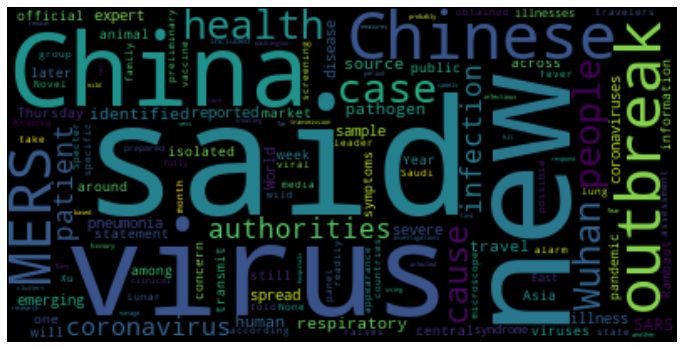

2020-01-18 1 Articles


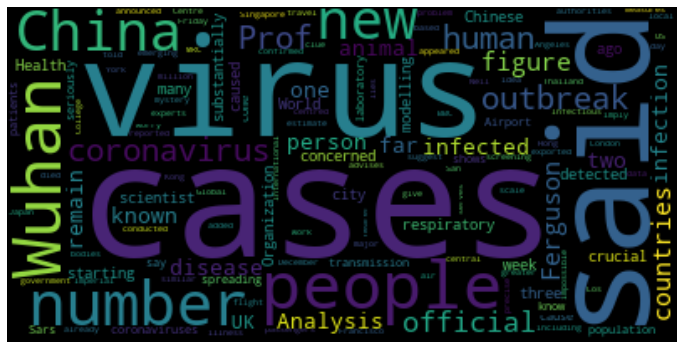

2020-01-19 1 Articles


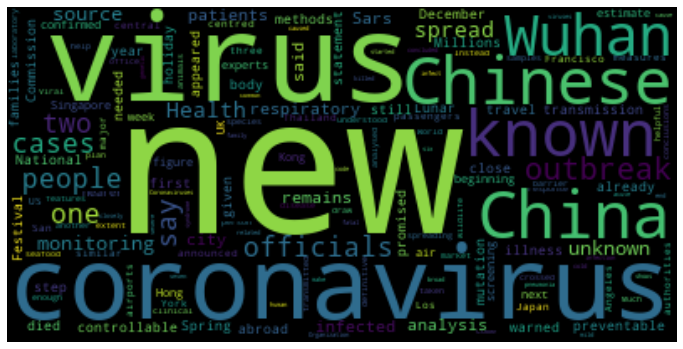

2020-01-20 3 Articles


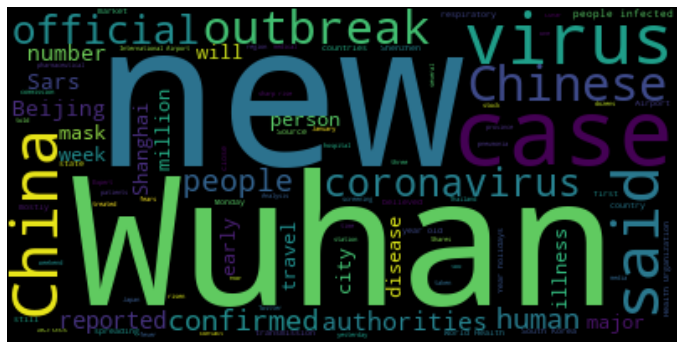

2020-01-21 4 Articles


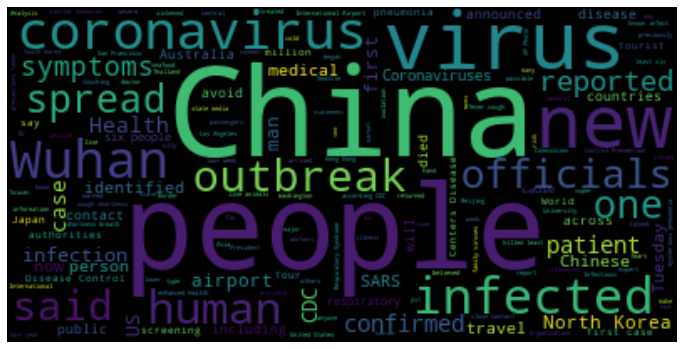

2020-01-22 11 Articles


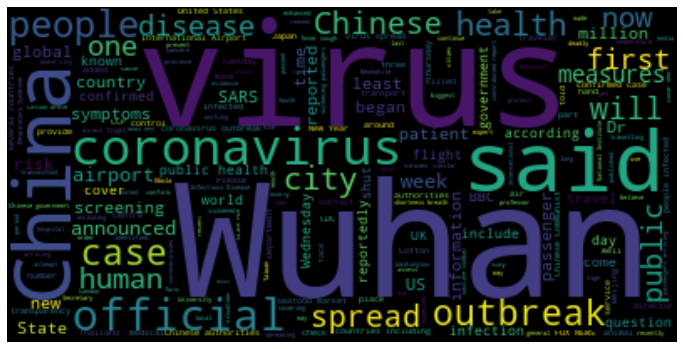

2020-01-23 14 Articles


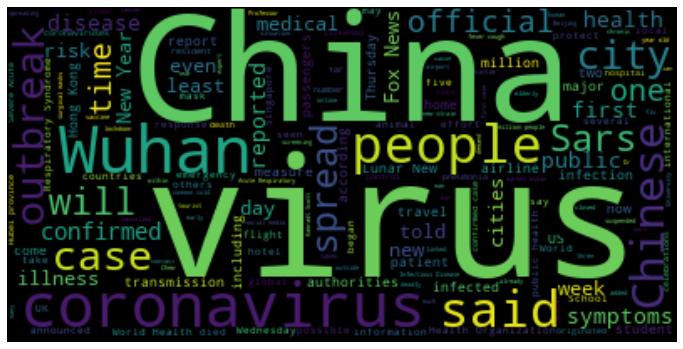

2020-01-24 7 Articles


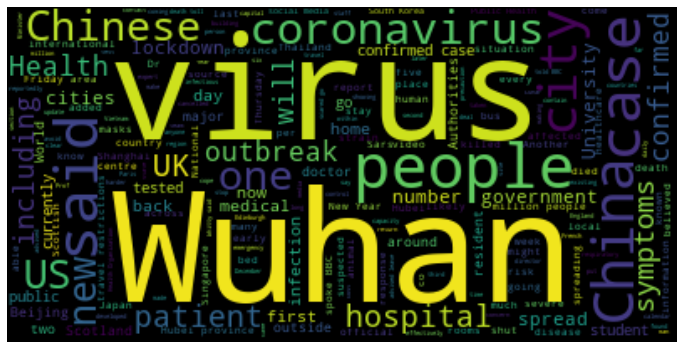

2020-01-25 7 Articles


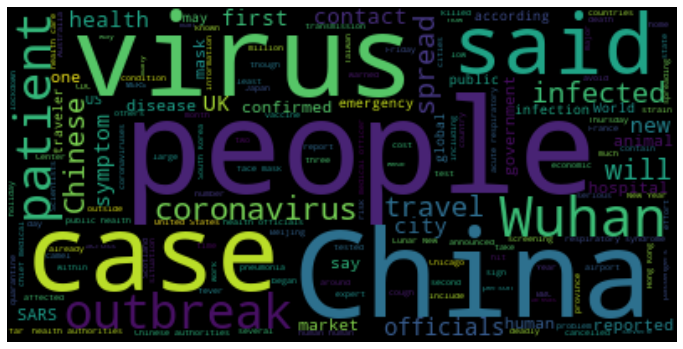

2020-01-26 4 Articles


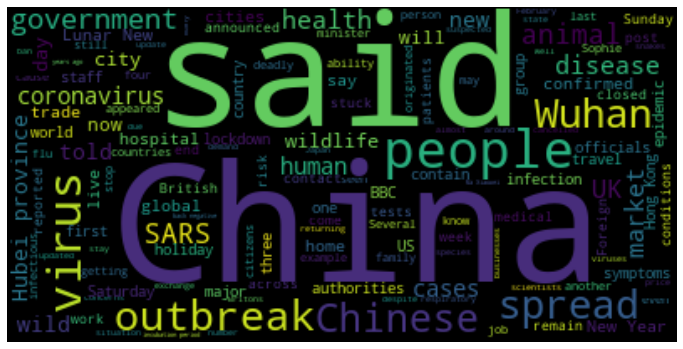

2020-01-27 16 Articles


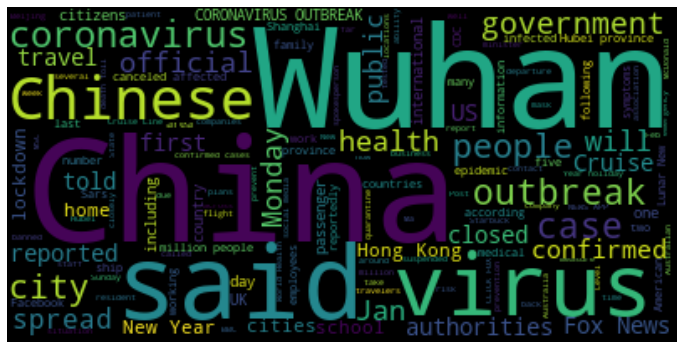

2020-01-28 17 Articles


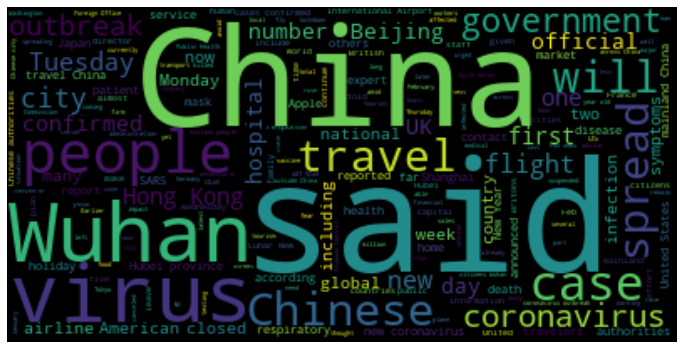

2020-01-29 23 Articles


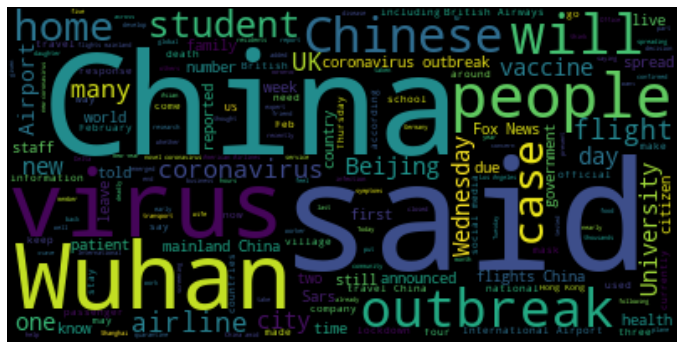

2020-01-30 26 Articles


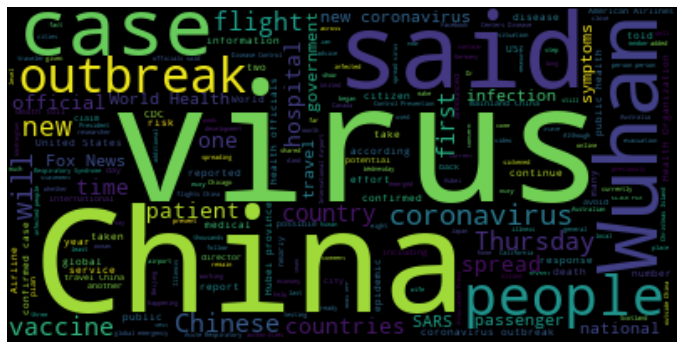

2020-01-31 14 Articles


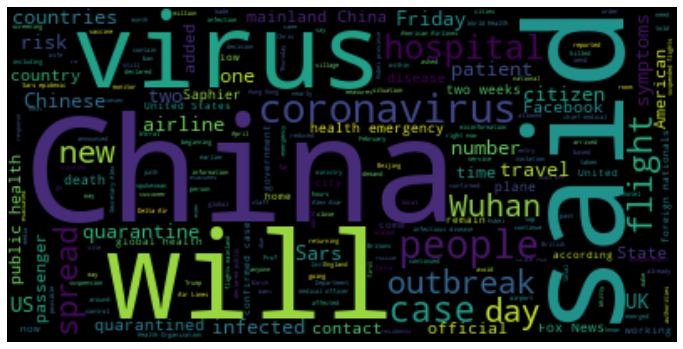

2020-02-01 3 Articles


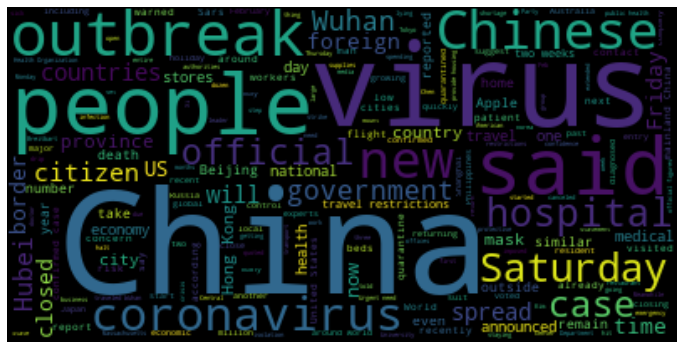

2020-02-02 5 Articles


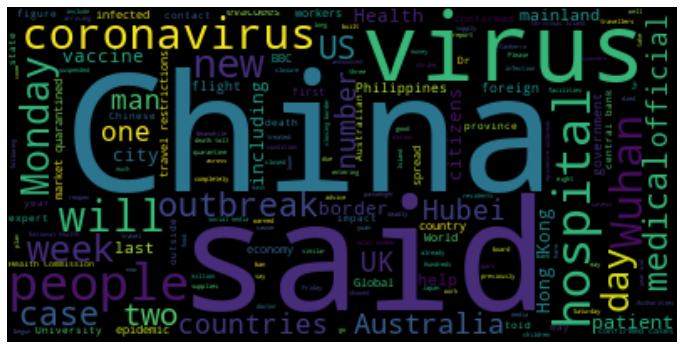

2020-02-03 10 Articles


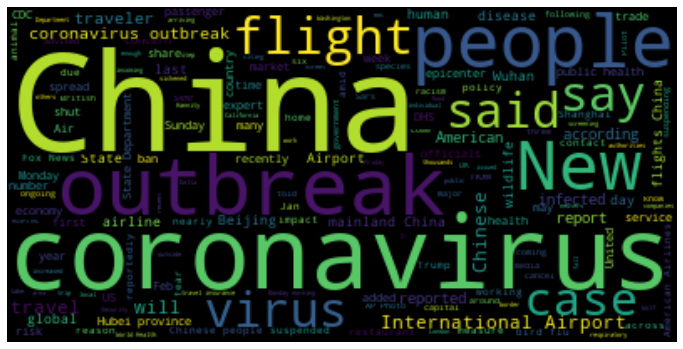

2020-02-04 8 Articles


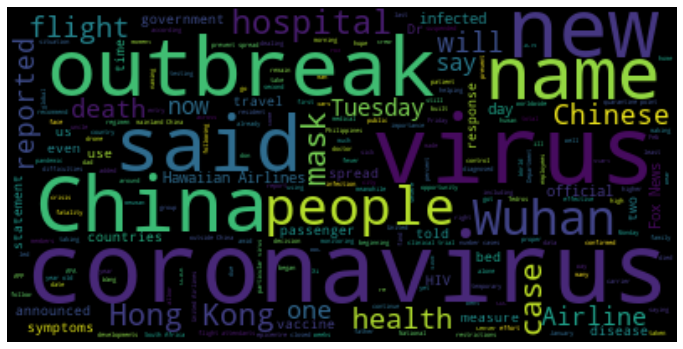

2020-02-05 7 Articles


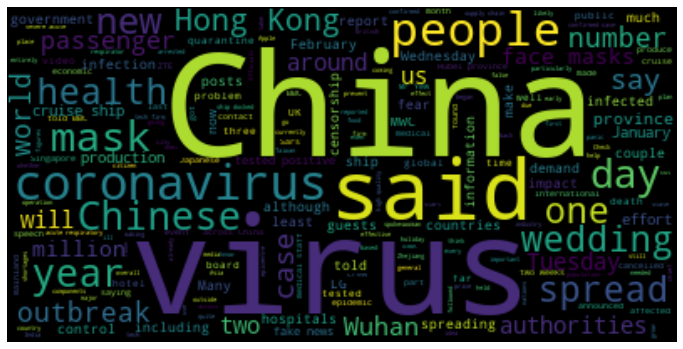

2020-02-06 8 Articles


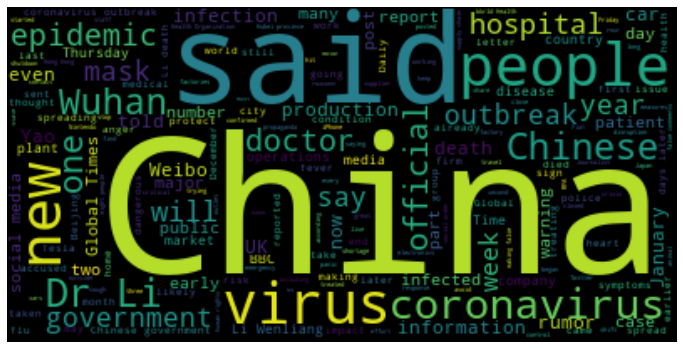

2020-02-07 14 Articles


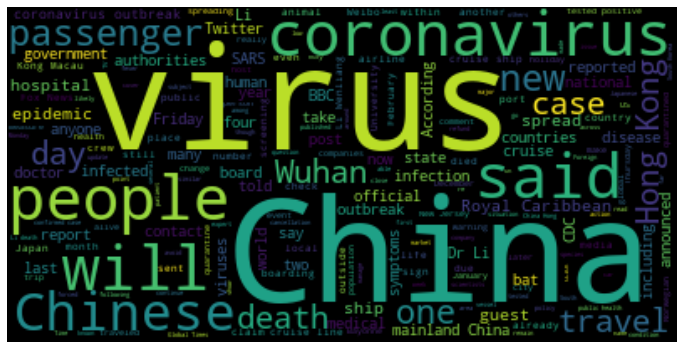

2020-02-08 3 Articles


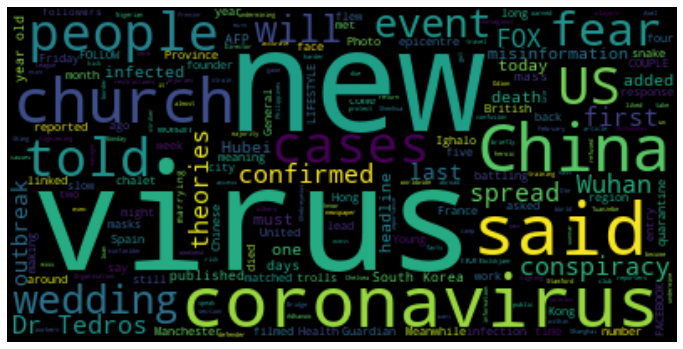

2020-02-09 3 Articles


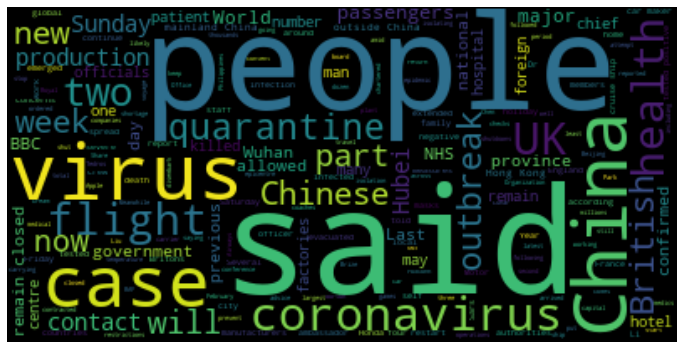

2020-02-10 10 Articles


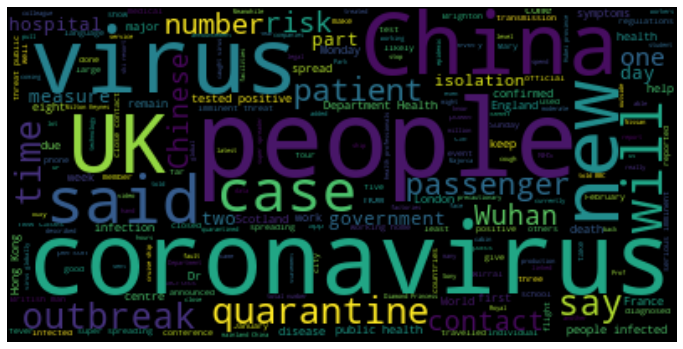

2020-02-11 7 Articles


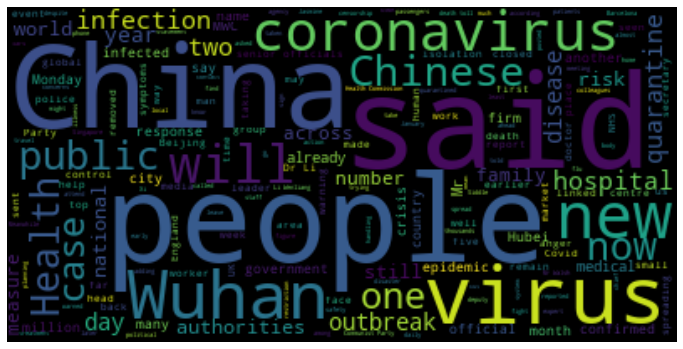

2020-02-12 9 Articles


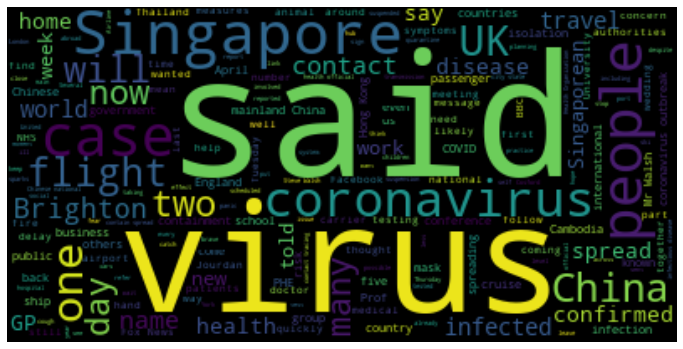

2020-02-13 11 Articles


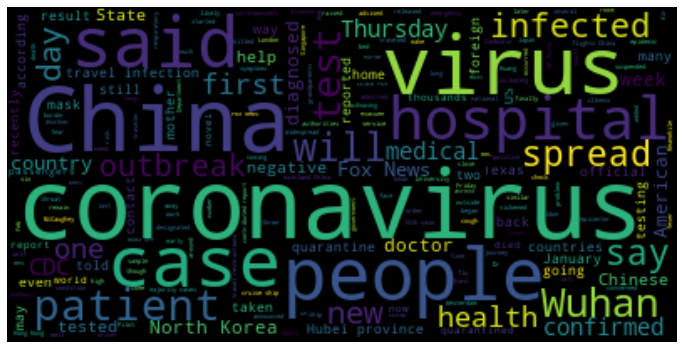

2020-02-14 6 Articles


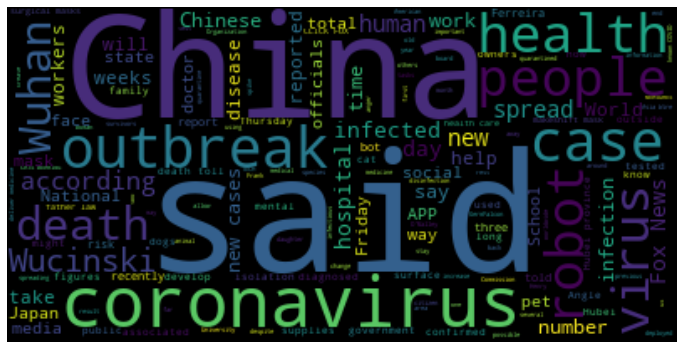

2020-02-15 2 Articles


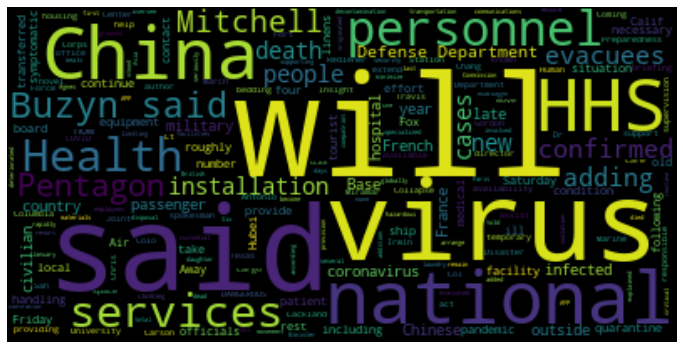

2020-02-16 1 Articles


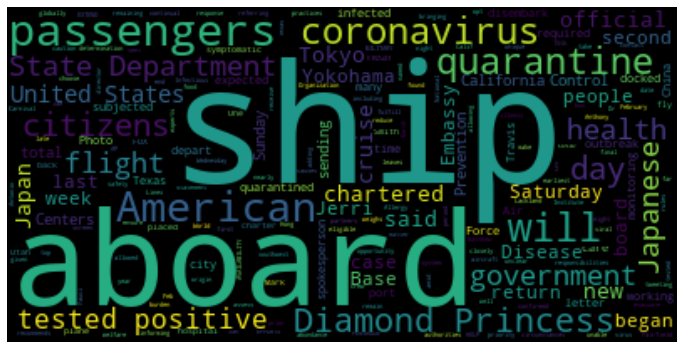

2020-02-17 5 Articles


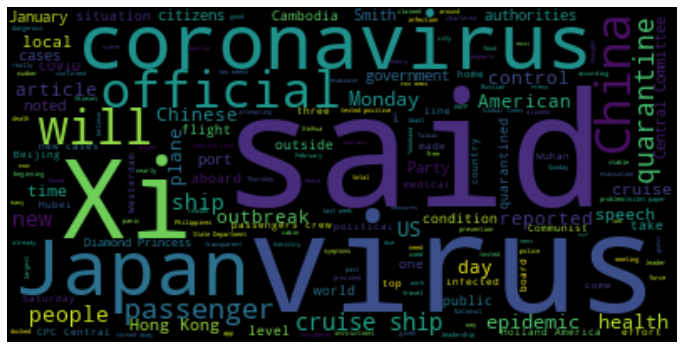

2020-02-18 5 Articles


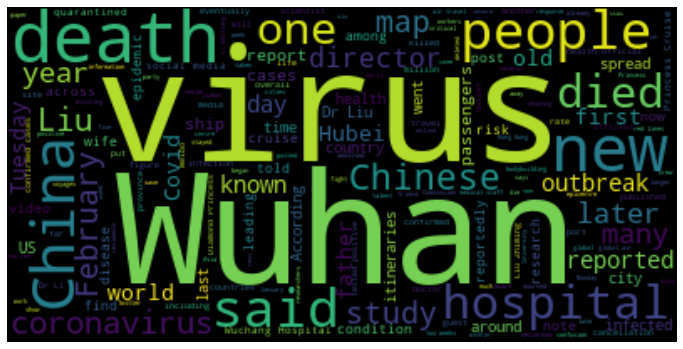

2020-02-19 4 Articles


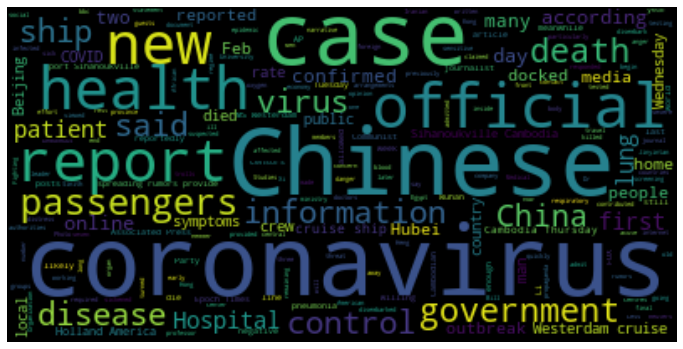

2020-02-20 9 Articles


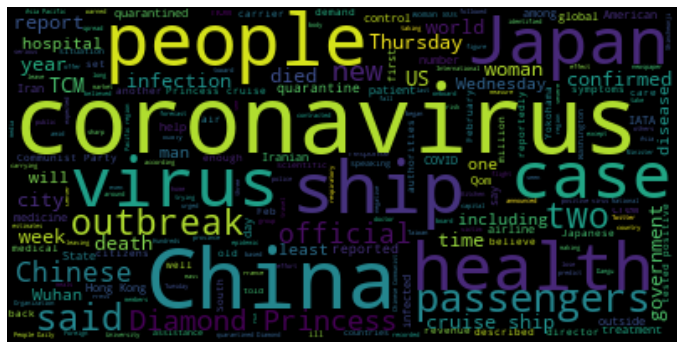

2020-02-21 54 Articles


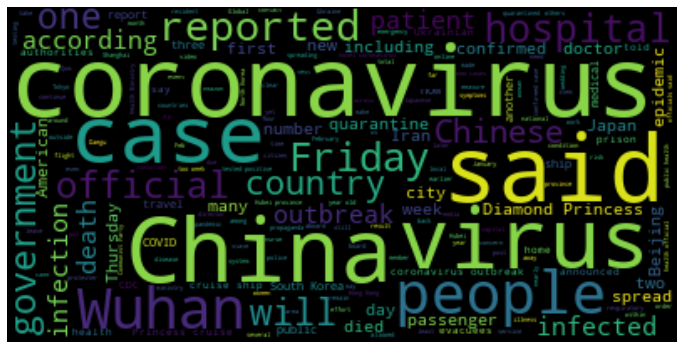

2020-02-22 5 Articles


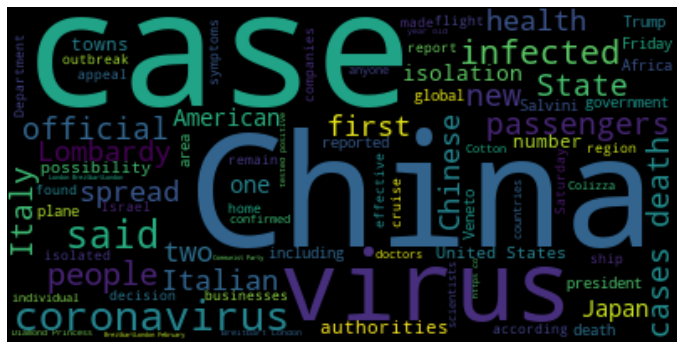

2020-02-23 12 Articles


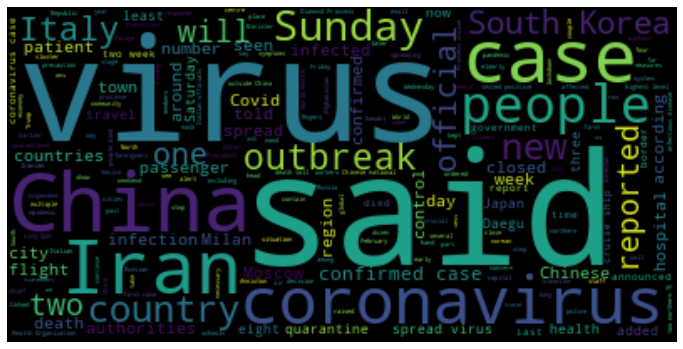

2020-02-24 27 Articles


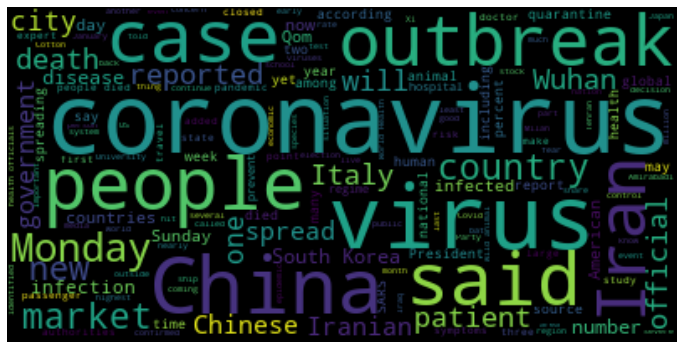

2020-02-25 52 Articles


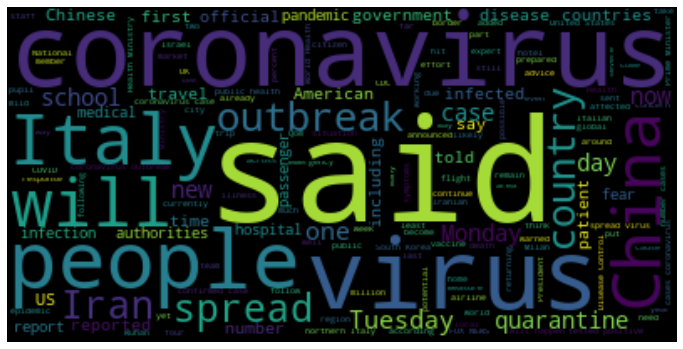

2020-02-26 53 Articles


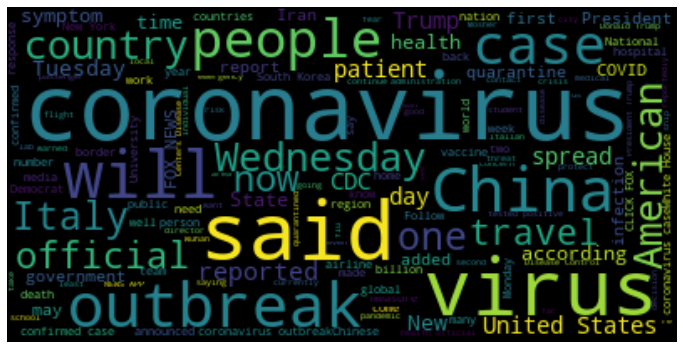

2020-02-27 75 Articles


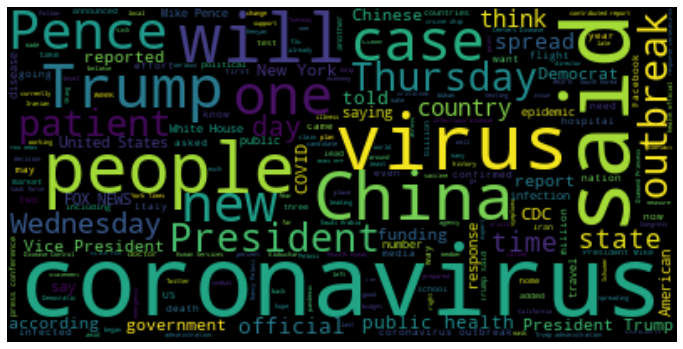

2020-02-28 7 Articles


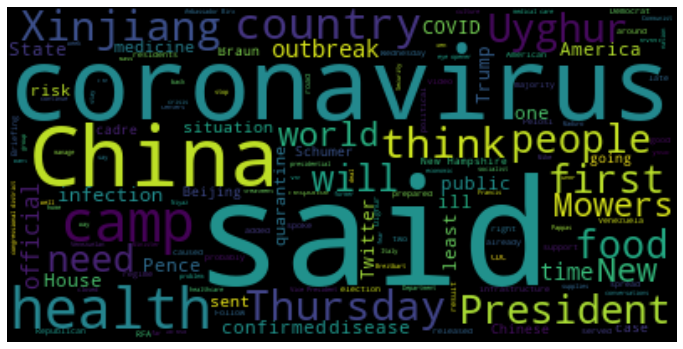

ParserError: day is out of range for month: 2/30/2020T00:00:00

In [94]:
target_date = parse('01/11/2020T00:00:00')

for m in range(1,3):
    for d in range(1,32):
        target_date = parse(str(m)+'/'+str(d)+'/2020T00:00:00')
        generate_word_cloud(target_date)


In [93]:
def generate_word_cloud(target_date):
    text = ''
    
    count = 0
    for article in data:
        if (parse(article['time-stamp']).date() != target_date.date()):
            continue

        count += 1

        text = " ".join([text, " ".join([item for item in article['content']])])

    if count > 0:
        print(target_date.date(), count, 'Articles')
        wordcloud = WordCloud().generate(text)

        plt.figure(figsize=(12,8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

### Results with Adj/Adv tag analysis
Works reasonably well in combination with sentiment analysis and dimensionality reduction methods

In [7]:
def tag_analysis(blobed):
    counts = Counter(tag for word,tag in blobed.tags)
    adj_list = []
    adv_list = []
    adj_tag_list = ['JJ','JJR','JJS']
    adv_tag_list = ['RB','RBR','RBS']
    for (a, b) in blobed.tags:
        if b in adj_tag_list:
           adj_list.append(a)
        elif b in adv_tag_list:
           adv_list.append(a)
        else:
            pass
    return adj_list, adv_list, counts['JJ']+counts['JJR']+counts['JJS'], counts['RB']+counts['RBR']+counts['RBS'], 

### Results with Sentiment Analysis not expressive enough
Built-in sentiment analysis did not work out well. There was no clear distinction between left-leaning journals (bbc, wp) vs right-leaning ones (fox)

In [9]:
def sentiment_analysis(blobed):
    
    return blobed.sentiment

### Results

In [13]:
colors = []
color_mapping = {
    'BBC': 'blue',
    'Washington Post': 'green',
    'FoxNews': 'red',
    'Breitbart': 'orange',
}

for result in analysis_result:
    colors.append(color_mapping[result['article']['journal']])

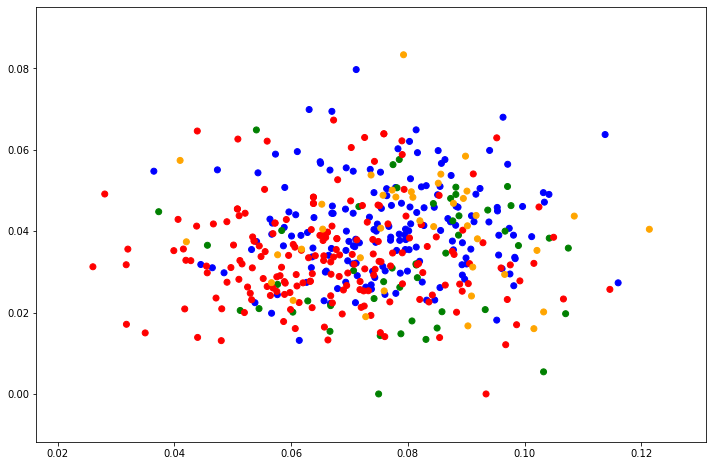

In [14]:
plt.figure(figsize=(12,8))
plt.scatter([a['rel_adj'] for a in analysis_result], [a['rel_adv'] for a in analysis_result], c=colors)
plt.show()

#### PCA

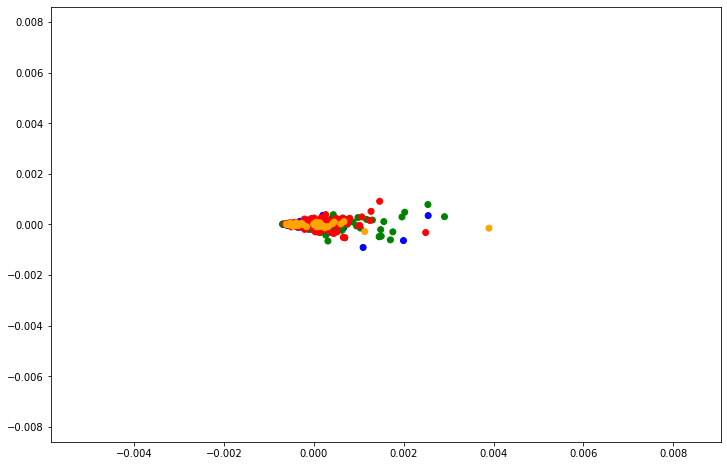

In [25]:
plt.figure(figsize=(12,8))
plt.scatter(pca_result[:,0], pca_result[:,1], c=colors)
plt.show()

#### TSNE

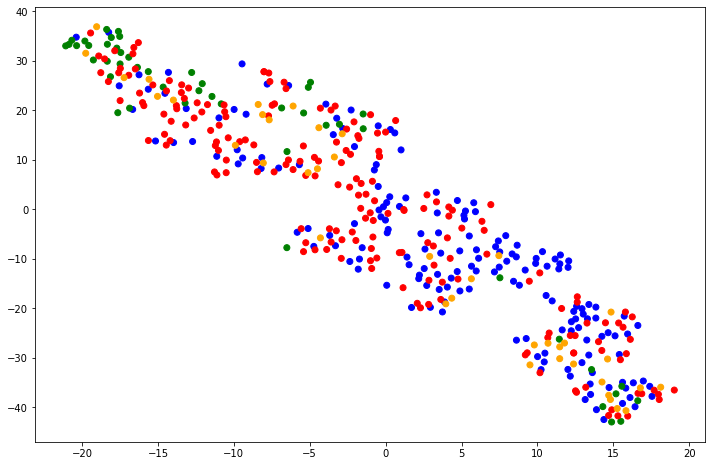

In [21]:
plt.figure(figsize=(12,8))
plt.scatter(tsne_result[:,0], tsne_result[:,1], c=colors)
plt.show()

In [40]:
max(analysis_result, key=lambda a: a['rel_adj']+a['rel_adv']+a['sentiment'].polarity+a['sentiment'].subjectivity)

{'article': {'content': ["Fox News Flash top headlines are here. Check out what's clicking on Foxnews.com.",
   'The effects of the coronavirus outbreak are spreading to more industries that just travel.',
   'THOUSANDS OF COUPLES TIE KNOT IN MASS WEDDING AMID CORONAVIRUS FEARS',
   "Just in time for what's\xa0known as National Wedding Month, a bridal boutique in Bakersfield, Calif., is sharing the impact of the coronavirus on its business --\xa0and why brides should not wait to order their dresses.",
   'Angela Jourdan, owner of Enchanted Bridal Boutique, spoke to FOX 2 about the effects of the virus, which has ultimately led to shipment delays for fabrics and gowns coming from China.',
   'CLICK HERE TO GET THE FOX NEWS APP',
   '\n      The coronavirus outbreak has led to temporary factory shutdowns, and manufacturing and production delays in the country, which then effects shipments.\n      (iStock)',
   '"Everything that we get [that comes] from China affects us dramatically," Jou

In [39]:
min(analysis_result, key=lambda a: a['rel_adj']+a['rel_adv']+a['sentiment'].polarity+a['sentiment'].subjectivity)

{'article': {'content': ["Fox News Flash top headlines for Feb. 4 are here. Check out what's clicking on Foxnews.com.",
   'United Airlines is suspending all flights to Hong Kong beginning Saturday, the airline announced. ',
   'In a statement provided Tuseday to Fox News, United Airlines said the decision was made due to a continued drop in demand for those flights,\xa0and they\xa0will remain suspended until Feb. 20. ',
   'The last United flight from the U.S. to Hong Kong will be on Wednesday, and the last flight eastbound from Hong Kong to the U.S. will be on Friday, the airline said.',
   'HONG KONG REPORTS CORONAVIRUS DEATH, MARKING 2ND FATALITY OUTSIDE CHINA',
   '\n      In a statement provided to Fox News, United Airlines said the decision was made due to a continued drop in demand and will remain suspended until Feb. 20.\n      (United Airlines)',
   '“These dates are fluid as the situation continues to evolve,” United added.',
   'The recent move by United comes amid concern 

In [53]:
analysis_result[np.argmax(pca_result)]

{'article': {'content': ['Infectious disease expert Dr. Amesh Adalja on what you need to know about the disease.',
   'A middle school in Northern Virginia this week canceled a visit of 21 Chinese exchange students and their chaperones amid the China-linked coronavirus outbreak that’s sickened more than 500 people and killed at least 17.',
   'In a letter sent to parents on Wednesday, Carole Kihm, the principal of Longfellow Middle School in Fairfax County, which the students were slated to temporarily attend, said they would no longer be visiting the school. The students are from Yichang in Hubei province — the same province where Wuhan, the city where the outbreak first began, is located.',
   'FIRST CASE OF CHINA-LINKED CORONAVIRUS REPORTED IN US, FEDERAL OFFICIALS SAY',
   'The students, who are reportedly all 12 years old, arrived in the U.S. on Wednesday, the same day they were informed they could no longer visit the school. They flew into New York’s John F. Kennedy airport –\xa0

In [54]:
analysis_result[np.argmin(pca_result)]

{'article': {'content': ['Fox News medical contributor Dr. Marc Siegel reports from the University of Nebraska Medical Center where patients are being treated.',
   'A Northern California woman who is the nation’s first\xa0coronavirus case of unknown origin was hospitalized for days before she was tested for the novel virus,\xa0according to the hospital where she initially sought treatment before being transferred to UC Davis Medical Center.',
   'The woman was first treated at NorthBay VacaValley Hospital, which is under the NorthBay Healthcare Group. In a statement provided to Fox News, Aimee Brewer, the president of NorthBay Healthcare Group, said the patient “at no time fit the existing CDC [Centers for Disease Control and Prevention] criteria for COVID-19, and therefore a test was not immediately administered.”',
   'CDC WARNS ON CORONAVIRUS IN US: SHOULD YOU START TO WORRY?',
   'In a press conference on Thursday, California Gov. Gavin Newsom also remarked on the case, saying the